In [1]:
import HTTP
import CSV
using Gumbo
using Cascadia

using DataFrames
using Pipe
using Dates
using RollingFunctions

using Plots

In [2]:
get_data = url -> begin
    prefix = "https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/"

    df = @pipe HTTP.get(prefix * url).body |>
        CSV.File |>
        DataFrame
end

cases_raw = get_data("time_series_covid19_confirmed_global.csv")
deaths_raw = get_data("time_series_covid19_deaths_global.csv")

size(cases_raw), size(deaths_raw)

((269, 306), (269, 306))

In [3]:
filter("Country/Region" => ==("China"), cases_raw) |> tail

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20
,String?,String,Float64,Float64,Int64,Int64,Int64,Int64
1,Sichuan,China,30.6171,102.71,5,8,15,28
2,Tianjin,China,39.3054,117.323,4,4,8,10
3,Tibet,China,31.6927,88.0924,0,0,0,0
4,Xinjiang,China,41.1129,85.2401,0,2,2,3
5,Yunnan,China,24.974,101.487,1,2,5,11
6,Zhejiang,China,29.1832,120.093,10,27,43,62


In [4]:
preprocess = df -> begin    
    df = @pipe df |>
        select(_, Not(["Province/State", "Lat", "Long"])) |>
        rename(_, "Country/Region" => "Country") |>
        stack(_, Not("Country"), variable_name = "Date", value_name = "Count") |>
        groupby(_, ["Country", "Date"]) |>  # don't care about provinces
        combine(_, "Count" => sum => "Count")

    rename_countries = Dict(
        "US" => "United States",
        "Czechia" => "Czech Republic",
        "Taiwan*" => "Taiwan",
    )
    df["Country"] = map(name -> name in keys(rename_countries) ? rename_countries[name] : name, df["Country"])
    
    df["Date"] = map(x -> Date(String(x), dateformat"m/d/y") + Year(2000), df["Date"])
    df
end

cases = preprocess(cases_raw)
deaths = preprocess(deaths_raw)

size(cases), size(deaths)

((57682, 3), (57682, 3))

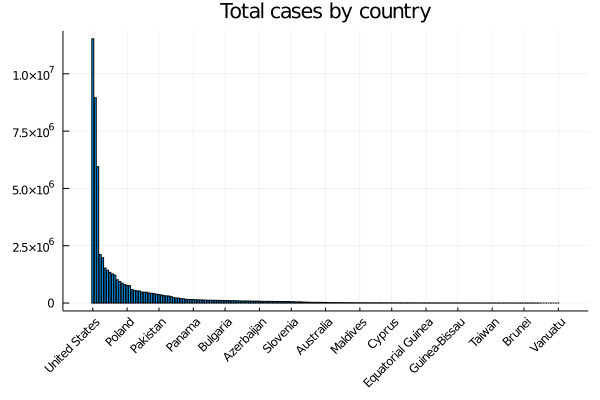

In [5]:
@pipe cases |>
    groupby(_, "Country") |>
    combine(_, "Count" => maximum => "Count") |>
    sort(_, "Count", rev = true) |>
    bar(_["Country"], _["Count"], xrotation = 45, legend = false, title = "Total cases by country")

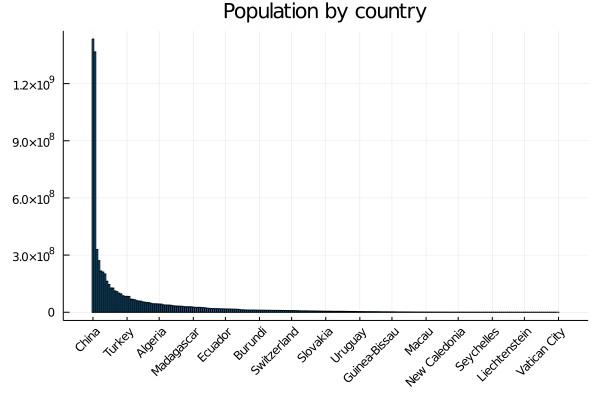

In [6]:
population = begin
    # Scrape
    
    url = "https://en.wikipedia.org/wiki/List_of_countries_by_population_(United_Nations)"
    page = parsehtml(read(download(url), String))
    rows = []

    for section in eachmatch(sel"table", page.root)
        caption = eachmatch(sel"caption b", section)
        if length(caption) > 0 && Gumbo.text(first(caption)) == "Countries and territories ranked by population in 2019"
            table = first(eachmatch(sel"table#main", section))
            for row in eachmatch(sel"tr", table)
                push!(rows, [Gumbo.text(entry) for entry in eachmatch(sel"td, th", row)])
            end
            break
        end
    end
    
    # Move to DataFrame
    
    df = DataFrame([col => [] for col in first(rows)])
    for i in 2:length(rows)
        if first(rows[i]) == "World"
            continue
        end
        push!(df, rows[i])
    end
    
    # Cleanup
    
    @pipe df |>
        transform(_,
            "Country/Territory" => (x -> strip.(replace.(x, r"[(\[].*[)\]]" => ""))) => "Country",
            "Population (1 July 2019)" => (x -> parse.(Float32, replace.(x, ',' => ""))) => "Population"
        ) |>
        select(_, ["Country", "Population"])
end

bar(population["Country"], population["Population"], xrotation = 45, legend = false, title = "Population by country")

In [7]:
diff_same_length(x) = [x[1]; diff(x)]
window_size = 14

data = @pipe leftjoin(cases, deaths, on = ["Country", "Date"], makeunique = true) |>
    rename(_,
        "Count" => "Cases",
        "Count_1" => "Deaths",
    ) |>
    outerjoin(_, population, on = "Country") |>
    sort(_, ["Country", "Date"]) |>
    groupby(_, "Country") |>
    transform(_,
        "Cases" => diff_same_length => "New cases",
        "Deaths" => diff_same_length => "New deaths",
    )

data |> tail

,Country,Date,Cases,Deaths,Population,New cases,New deaths
,String,Date?,Int64?,Int64?,Float32?,Int64?,Int64?
1,Zimbabwe,2020-11-13,8765,257,1.46455f7,69,2
2,Zimbabwe,2020-11-14,8786,257,1.46455f7,21,0
3,Zimbabwe,2020-11-15,8829,257,1.46455f7,43,0
4,Zimbabwe,2020-11-16,8897,257,1.46455f7,68,0
5,Zimbabwe,2020-11-17,8945,260,1.46455f7,48,3
6,Zimbabwe,2020-11-18,8981,261,1.46455f7,36,1


┌ Info: Saved animation to 
│   fn = /home/tymek/Documents/Private/LearningJulia/tmp.gif
└ @ Plots /home/tymek/.julia/packages/Plots/fewot/src/animation.jl:104


Plots.AnimatedGif("/home/tymek/Documents/Private/LearningJulia/tmp.gif")
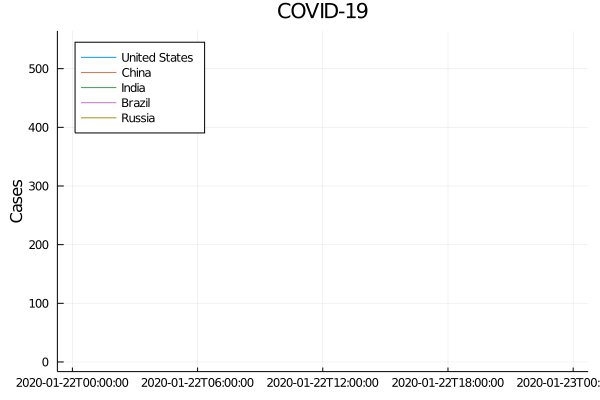

In [8]:
anim = begin
    countries = ["United States", "China", "India", "Brazil", "Russia"]
    column = "Cases"
    dates = range(minimum(dropmissing(data)["Date"]), maximum(dropmissing(data)["Date"]), step = Day(1))
    
    @animate for day in dates
        plot(legend = :topleft, title = "COVID-19")
        for country in countries
            tmp = @pipe data |>
                filter("Country" => ==(country), _) |>
                filter("Date" => <=(day), _) |>
                sort(_, "Date")
            
            plot!(tmp["Date"], tmp[column], label = country, ylab = column)
        end
    end
end

gif(anim, fps = 7)

┌ Info: Saved animation to 
│   fn = /home/tymek/Documents/Private/LearningJulia/tmp.gif
└ @ Plots /home/tymek/.julia/packages/Plots/fewot/src/animation.jl:104


Plots.AnimatedGif("/home/tymek/Documents/Private/LearningJulia/tmp.gif")
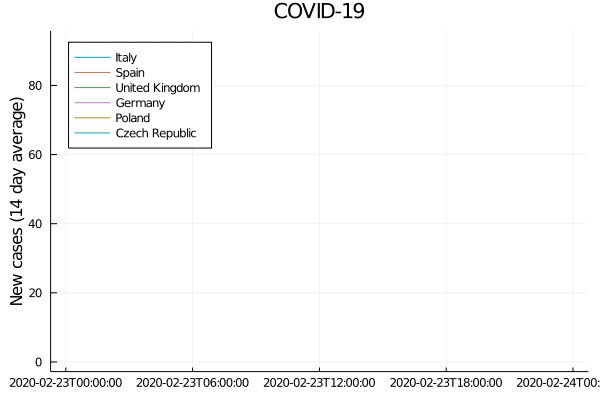

In [9]:
anim = begin
    window_size = 14
    column = "New cases"
    countries = ["Italy", "Spain", "United Kingdom", "Germany", "Poland", "Czech Republic"]
    
    # first cases in Italy
    start = argmax((data["Country"] .== "Italy") .& (data["New cases"] .> 50))
    start_date = data[start, "Date"]

    dates = range(start_date, maximum(dropmissing(data)["Date"]), step = Day(1))
    
    @animate for day in dates
        plot(legend = :topleft, title = "COVID-19")
        for country in countries
            tmp = @pipe data |>
                filter("Country" => ==(country), _) |>
                filter("Date" => >=(start_date), _) |>
                filter("Date" => <=(day), _) |>
                sort(_, "Date")
            
            values = tmp[column]
            if length(values) > window_size
                values = runmean(values, window_size)
            end
            
            plot!(tmp["Date"], values, label = country, ylab = "$column ($window_size day average)")
        end
    end
end

gif(anim, fps = 4)

In [10]:
@pipe data |>
    groupby(_, "Country") |> 
    combine(_, "Cases" => maximum => "Cases", "Deaths" => maximum => "Deaths") |>
    dropmissing |>
    head

,Country,Cases,Deaths
,String,Int64,Int64
1,Afghanistan,43851,1645
2,Albania,29837,646
3,Algeria,70629,2206
4,Andorra,6018,76
5,Angola,13922,332
6,Antigua and Barbuda,139,4
